# What is a neural networks ? How it works ? How it's trained ? The math behind neural networks

This notebook will introduce what a neural network is, how it works, and how it's trained by approaching the math behind.

## Notebook setup

We import the required modules.

In [1]:
import pickle
import os

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.neural_network import MLPClassifier, MLPRegressor

In [3]:
from utils import *

In [4]:
%matplotlib inline

In [5]:
plt.style.use('dark_background')
rcParams["figure.facecolor"] = "#212121"
rcParams["axes.facecolor"] = "#212121"

## Generating datasets for learning

In this section, we generate datasets for the various problems we will be covering in this notebook:

- linear classification
- non-linear classification
- linear regression
- non-linear regression

### Linear classification

In [6]:
N = 300
x = np.random.uniform(-1., 1., N)
y = np.random.uniform(-1., 1., N)
c = np.ones((N,))
mask = 1 * y + 2 * x - 0.5 < 0
c[mask] = -1.0

In [7]:
if not os.path.exists("lin_clf_dataset.csv"):
    df_lin_clf = pd.DataFrame({"x": x, "y": y, "c": c})
    df_lin_clf.to_csv("lin_clf_dataset.csv", index=False)
else:
    df_lin_clf = pd.read_csv("lin_clf_dataset.csv")

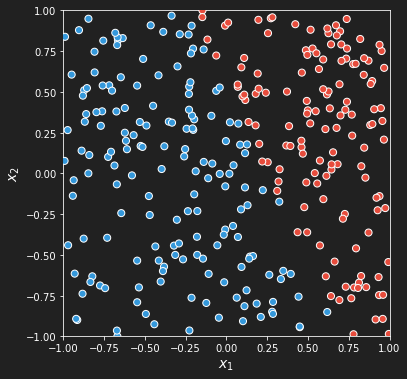

In [8]:
_x = np.vstack((df_lin_clf.x, df_lin_clf.y)).T
fig = plot_line_and_points(x=_x, c=df_lin_clf.c.values)
fig.savefig("lin-clf-dataset.png", dpi=100, facecolor="#212121")

### Non-linear classification

In [9]:
N = 300
x = np.random.uniform(-1., 1., N)
y = np.random.uniform(-1., 1., N)
c = np.ones((N,))
mask = (y < 2 * x - 0.5) | (y < -2 * x - 0.5)
c[mask] = -1.0

In [10]:
if not os.path.exists("nl_clf_dataset.csv"):
    df_nl_clf = pd.DataFrame({"x": x, "y": y, "c": c})
    df_nl_clf.to_csv("nl_clf_dataset.csv", index=False)
else:
    df_nl_clf = pd.read_csv("nl_clf_dataset.csv")

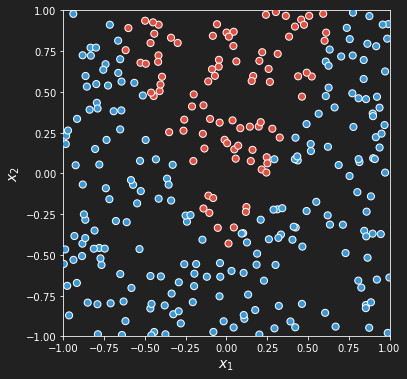

In [11]:
_x = np.vstack((df_nl_clf.x, df_nl_clf.y)).T
fig = plot_line_and_points(x=_x, c=df_nl_clf.c.values)
fig.savefig("nl-clf-dataset.png", dpi=100, facecolor="#212121")

### Linear regression

In [12]:
N = 100
x = np.random.uniform(-1., 1., N)
y = x + np.random.normal(0., 0.1, N)

In [13]:
if not os.path.exists("lin_reg_dataset.csv"):
    df_lin_reg = pd.DataFrame({"x": x, "y": y})
    df_lin_reg.to_csv("lin_reg_dataset.csv", index=False)
else:
    df_lin_reg = pd.read_csv("lin_reg_dataset.csv")

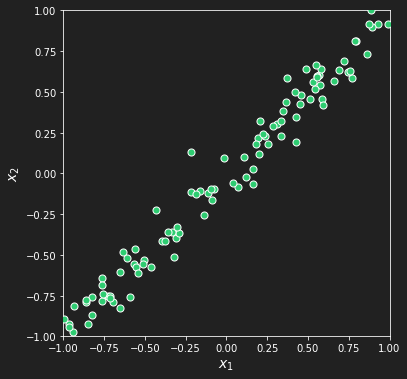

In [14]:
_x = np.vstack((df_lin_reg.x, df_lin_reg.y)).T
fig = plot_line_and_points(x=_x)
fig.savefig("lin-reg-dataset.png", dpi=100, facecolor="#212121")

### Non-linear regression

In [15]:
N = 100
x = np.random.uniform(-1., 1., N)
y = 0.5 * (x + 1)**2 - 1.0 + np.random.normal(0., 0.05, N)

In [16]:
if not os.path.exists("nl_reg_dataset.csv"):
    df_nl_reg = pd.DataFrame({"x": x, "y": y})
    df_nl_reg.to_csv("nl_reg_dataset.csv", index=False)
else:
    df_nl_reg = pd.read_csv("nl_reg_dataset.csv")

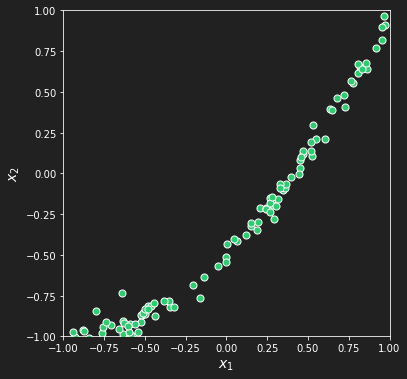

In [17]:
_x = np.vstack((df_nl_reg.x, df_nl_reg.y)).T
fig = plot_line_and_points(x=_x)
fig.savefig("nl-reg-dataset.png", dpi=100, facecolor="#212121")

## Refresher on mathematics

Let's take a line equation in a 2D space. The equation of a line is:

$$
\large a \cdot x_1 + b \cdot x_2 + c = 0
$$

This line separates the 2D space in two regions:

<ul>
<li><p style="color: #3498DB">
A region below the line:
$$
\large a \cdot x_1 + b \cdot x_2 + c < 0
$$
</p></li>

<li><p style="color: #E74C3C">
A region above the line:
$$
\large a \cdot x_1 + b \cdot x_2 + c > 0
$$
</p></li>
</ul>

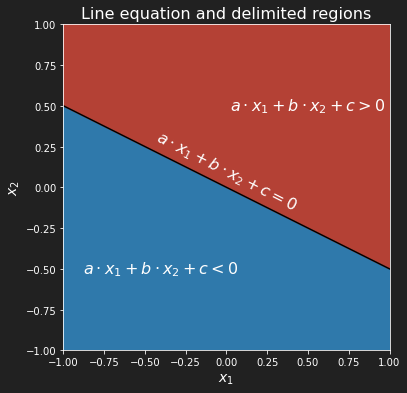

In [18]:
w = np.array([0.5, 1.0, 0.])
fig = plot_line_and_points(w)
ax = fig.axes[0]
ax.annotate(r"$a \cdot x_1 + b \cdot x_2 + c = 0$", (0., 0.1), rotation=-27.0, va='center', ha='center', 
            fontsize=16, color='white')
ax.annotate(r"$a \cdot x_1 + b \cdot x_2 + c > 0$", (0.5, 0.5), va='center', ha='center', 
            fontsize=16, color='white')
ax.annotate(r"$a \cdot x_1 + b \cdot x_2 + c < 0$", (-0.4, -0.5), va='center', ha='center', 
            fontsize=16, color='white');
ax.set_title("Line equation and delimited regions", fontsize=16);
fig.savefig("line-equation-regions.png", dpi=100, facecolor="#212121")

The quantity $a \cdot x_1 + b \cdot x_2 + c = 0$ measures how far the point is from the line and on which side it is.

The plot below display the value of the quantity. Darker colors are used for quantity with higher magnitude while blue and red colors still represent the side on which the point lie. Somehow the quantity gives a measurement of the *distance*.

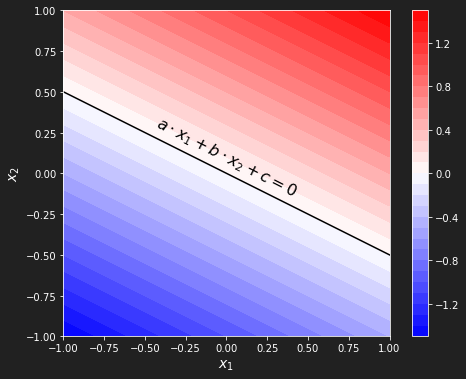

In [19]:
fig = plot_line_and_points(w, levels=32, figsize=(8, 6))
ax = fig.axes[0]
ax.annotate(r"$a \cdot x_1 + b \cdot x_2 + c = 0$", (0., 0.1), rotation=-27.0, va='center', ha='center', 
            fontsize=16, color='black');
fig.savefig("line-equation-contour.png", dpi=100, facecolor="#212121")

## Perceptron algorithm

The quantity:

$$
\large a \cdot x_{1,P} + b \cdot x_{2,P} + c
$$

increases when the point P is moving away from the line in the <span style="color: #E74C3C">red region</span>, decreases when the point P is moving away from the line in the <span style="color: #3498DB">blue region</span> and gets close to 0 when the point moving close to the line.

The quantity can be written as the dot product of two vectors formed by the coefficients of line and coordinates of point P:

$$
\large
\begin{bmatrix}a \\ b \\ c\end{bmatrix} \cdot \begin{bmatrix}x_P \\ y_P \\ 1\end{bmatrix} = a \cdot x_P + b \cdot y_P + c
$$

So how can we make the absolute value of this dot product decrease ?

There are two configurations:

- if the dot product is positive, we need to decrease the dot product to decrease its absolute value
- if the dot product is negative, we need to increase the dot product to decrease its absoute value

The dot product is positive when P is in the <span style="color: #E74C3C">red region</span>:

$$
\large a \cdot x_P + b \cdot y_P + c > 0
$$

The dot product is negative when P is in the <span style="color: #3498DB">blue region</span>:

$$
\large a \cdot x_P + b \cdot y_P + c < 0
$$

To reduce the distance between the point and the line, we suggest the following algorithm. We assume that we are in the <span style="color: #E74C3C">red region</span>. We are going to remove a small quantity $\alpha > 0$ of the second vector from the first vector so that the dot product becomes:

$$
\large
\begin{bmatrix}a - \alpha x_P\\ b -\alpha y_P \\ c - \alpha\end{bmatrix} \cdot \begin{bmatrix}x_P \\ y_P \\ 1\end{bmatrix} = 
a \cdot x_P + b \cdot y_P + c - \alpha (x_P^2 + y_P^2 +1)
$$

So the quantity we are removing from the first vector is:

$$
\large \alpha (x_P^2 + y_P^2 +1)
$$

This quantity is striclty positive.

If P is in the <span style="color: #3498DB">blue region</span>, this quantity is added to the dot product instead.

So we can write a very simple algorithm to make the line closer to P:

- we initialise a line with a, b, and c parameters
- given a point P of coordinates [$x_P$, $y_p$]
- while $\lvert a \cdot x_P + b \cdot y_P + c \rvert > 0$:
    - if $a \cdot x_P + b \cdot y_P + c > 0$:
        - $a \leftarrow a - \alpha x_P$ 
        - $b \leftarrow b - \alpha y_P$
        - $c \leftarrow c - \alpha$
    - else:
        - $a \leftarrow a + \alpha x_P$ 
        - $b \leftarrow b + \alpha y_P$
        - $c \leftarrow c + \alpha$
        
This algorithm is the perceptron algorithm and has been invented in 1957 by Frank Rosenblatt.

### Utility functions

In [20]:
def point_3_coords(x):
    _x = np.ones((3,))
    _x[0:2] = x
    return _x

In [21]:
def weighted_sum(w, x):
    return (w * point_3_coords(x)).sum()  # equivalent to np.dot(w, x)

In [22]:
def get_point_region(w, x):
    dot = weighted_sum(w, x)
    if dot >= 0.:
        return +1.  # return +1 if in the red region
    return -1.  # return -1 if in the blue region

In [23]:
def move_closer_to(w, x, alpha):
    sign = get_point_region(w, x)
    w = w - sign * alpha * point_3_coords(x)
    return w

In [24]:
def move_farther_from(w, x, alpha):
    sign = get_point_region(w, x)
    return w + sign * alpha * point_3_coords(x)   

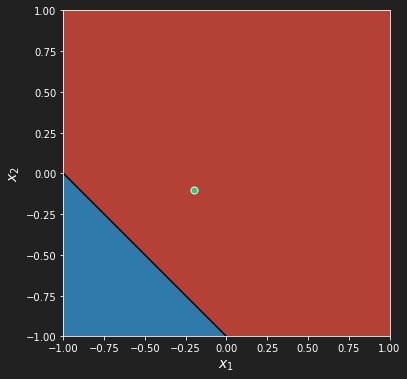

In [25]:
w = np.array([1., 1., 1.])
x = np.array([-0.2, -0.1])
fig = plot_line_and_points(w, x)
fig.savefig("line-closer-01.png", dpi=100, facecolor="#212121")

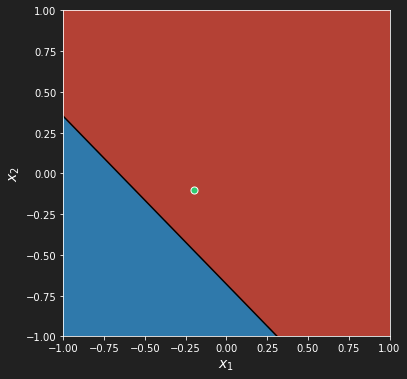

In [26]:
w = move_closer_to(w, x, alpha=0.3)
fig = plot_line_and_points(w, x)
fig.savefig("line-closer-02.png", dpi=100, facecolor="#212121")

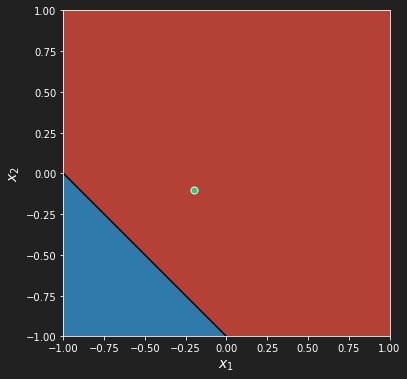

In [27]:
w = move_farther_from(w, x, alpha=0.3)
fig = plot_line_and_points(w, x)
fig.savefig("line-closer-03.png", dpi=100, facecolor="#212121")

### Linear regression

In [28]:
def regression(w, x, alpha, nb_iter=1, hist_w=None):
    for i in range(nb_iter):
        for _x in x:
            w = move_closer_to(w, _x, alpha)
        if hist_w is not None:
            hist_w.append(w)
    return w

In [29]:
w = np.array([3.0, 1., -3.0])
hist_w = [w]
x = np.vstack((df_lin_reg.x, df_lin_reg.y)).T

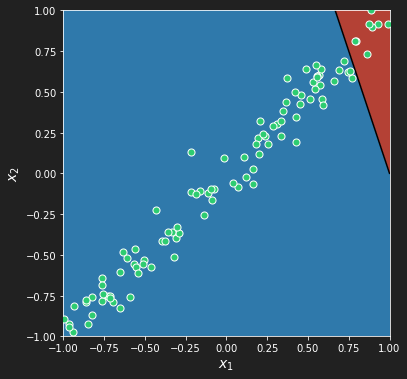

In [30]:
fig = plot_line_and_points(w, x)
fig.savefig("lin-reg-01.png", dpi=100, facecolor="#212121")

We make a single pass through the dataset:

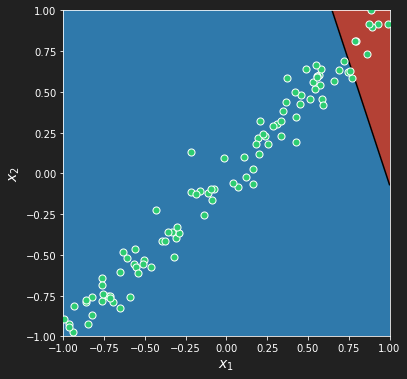

In [31]:
w = regression(w, x, alpha=0.001, hist_w=hist_w)
fig = plot_line_and_points(w, x)
fig.savefig("lin-reg-02.png", dpi=100, facecolor="#212121")

There is almost no change in the line due to $\alpha$ being small. Let's perform more passes:

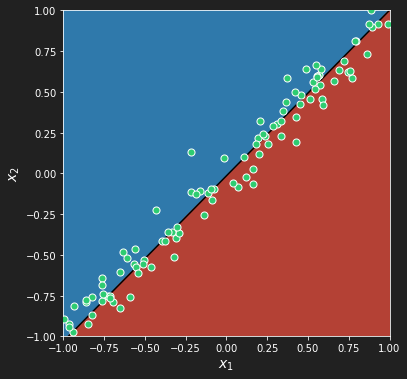

In [32]:
w = regression(w, x, alpha=0.001, hist_w=hist_w, nb_iter=75)
fig = plot_line_and_points(w, x)
fig.savefig("lin-reg-03.png", dpi=100, facecolor="#212121")

This is how the line is updated:

In [33]:
# The animation is deactivated to save space in the notebook, turn it one if you want ;)
# anim = make_regression_animation(x, hist_w)
# anim.display()

In [34]:
# anim.save("lin-reg.gif", dpi=200)

### Linear classification

In [35]:
def classification(w, x, c, alpha, nb_iter=1, hist_w=None):
    for i in range(nb_iter):
        for _x, _c in zip(x, c):
            sign = get_point_region(w, _x)
            if sign * _c < 0:
                w = move_closer_to(w, _x, alpha)
        hist_w.append(w)
    return w

In [36]:
w = np.array([2., -5., 1.])
x = np.vstack((df_lin_clf.x, df_lin_clf.y)).T
c = df_lin_clf.c
hist_w = [w]

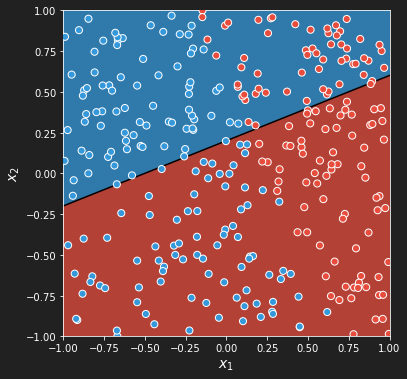

In [37]:
fig = plot_line_and_points(w, x, c)
fig.savefig("lin-clf-01.png", dpi=100, facecolor="#212121")

We make a single pass through the dataset:

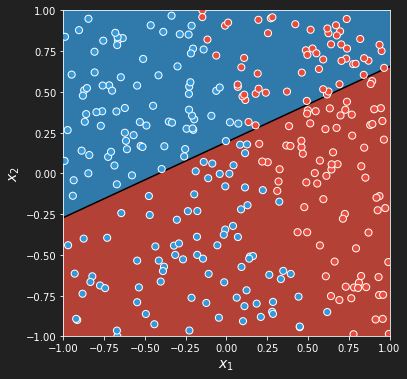

In [38]:
w = classification(w, x, c, alpha=0.004, hist_w=hist_w)
fig = plot_line_and_points(w, x, c)
fig.savefig("lin-clf-02.png", dpi=100, facecolor="#212121")

The line has barely moved because we used a small value for $\alpha$. Let's do additional passes:

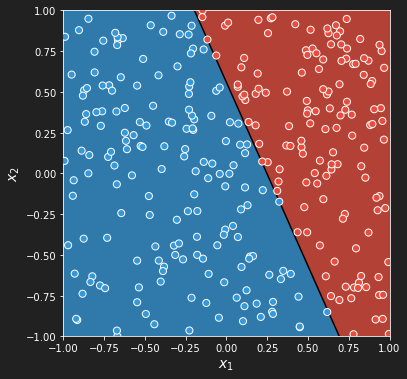

In [39]:
w = classification(w, x, c, alpha=0.004, nb_iter=75, hist_w=hist_w)
fig = plot_line_and_points(w, x, c)
fig.savefig("lin-clf-03.png", dpi=100, facecolor="#212121")

In [40]:
# The animation is deactivated to save space in the notebook, turn it one if you want ;)
# anim = make_classification_animation(x, c, hist_w)
# anim.display()

In [41]:
# anim.save("lin-clf.gif", dpi=200)

## Linear problems in higher dimensionality

In this section, we try to illustrate how a neural network works in a higher dimension to solve linear classification problems.

In [42]:
# Points

xs, ys, zs = np.meshgrid(np.linspace(-1., 1., 5), np.linspace(-1., 1., 5), np.linspace(-1., 1., 5))
c = np.ones(xs.shape)
mask = zs < 0
c[mask] = -1.0

# Plane

xp, yp = np.meshgrid(np.linspace(-1., 1., 11), np.linspace(-1., 1., 11))
zp = xp + yp + 0.
zp = np.zeros(xp.shape) + 0.

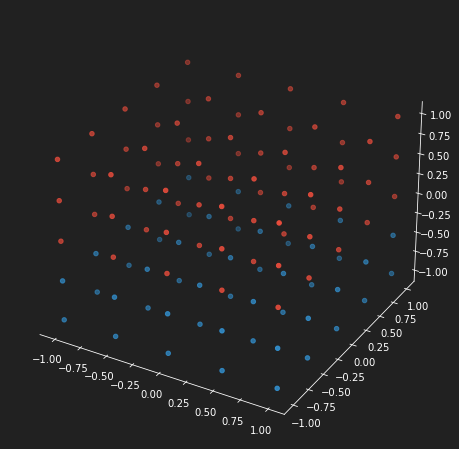

In [43]:
# Scatter plot in 3D

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs, ys, zs, c=c, cmap=MyColorMap());
ax.grid(False)
ax.w_xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
fig.savefig("lin-clf-3d-01.png", dpi=100, facecolor="#212121")

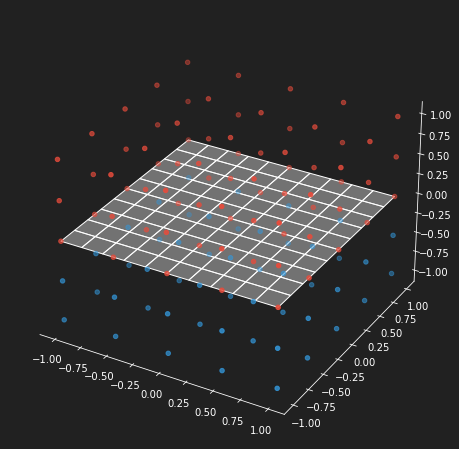

In [44]:
# Scatter plot in 3D with plane

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs, ys, zs, c=c, cmap=MyColorMap());
ax.grid(False)
ax.w_xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.w_zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
xp, yp = np.meshgrid(np.linspace(-1., 1., 11), np.linspace(-1., 1., 11))
zp = xp + yp + 0.
zp = np.zeros(xp.shape) + 0.
ax.plot_surface(xp, yp, zp, color=(1., 1., 1., 0.5), edgecolor=(1., 1., 1., 1.0));
fig.savefig("lin-clf-3d-02.png", dpi=100, facecolor="#212121")

## Scikit-Learn

In this section, non-linear classification and non-linear regression are solved using neural networks as implemented in Scikit Learn library which is the easiest way of having neuron networks trained on simple problems.

### Scikit-Learn: classification

We use the MLPClassifier (Multi-Layer Perceptron) algorithm. We need to build the training sample by separating the inputs from the outputs:

In [45]:
x = np.vstack((df_nl_clf.x, df_nl_clf.y)).T
y = df_nl_clf.c * 0.5 + 0.5  # scale the output in the range [0., 1.] for the classifier

Here is what the problem looks like:

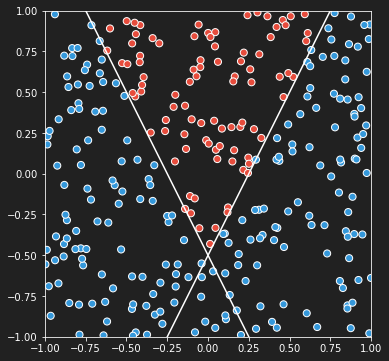

In [46]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111)
ax.scatter(x[:, 0], x[:, 1], c=y, cmap=MyColorMap(), edgecolor='w', s=50)
_x = np.linspace(-2., 2., 11)
_y1 = -2. * _x - 0.5
_y2 = 2. * _x - 0.5
ax.plot(_x, _y1, c="w")
ax.plot(_x, _y2, c="w")
ax.set_xlim((-1., 1.))
ax.set_ylim((-1., 1.));
ax.set_aspect("equal")
fig.savefig("nl-clf-01.png", dpi=100, facecolor="#212121")

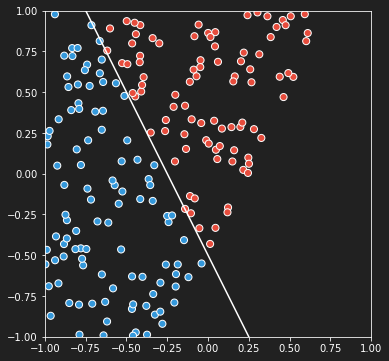

In [47]:
_x = np.linspace(-2., 2., 11)
_y1 = -2. * _x - 0.5
mask = ~(x[:, 1] < 2. * x[:, 0] - 0.5)
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111)
ax.scatter(x[mask, 0], x[mask, 1], c=y[mask], cmap=MyColorMap(), edgecolor='w', s=50)
ax.plot(_x, _y1, c="w")
ax.set_xlim((-1., 1.))
ax.set_ylim((-1., 1.));
ax.set_aspect("equal")
fig.savefig("nl-clf-05.png", dpi=100, facecolor="#212121")

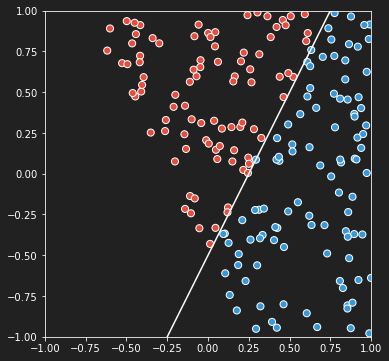

In [48]:
_x = np.linspace(-2., 2., 11)
_y2 = 2. * _x - 0.5
mask = ~(x[:, 1] < -2. * x[:, 0] - 0.5)
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111)
ax.scatter(x[mask, 0], x[mask, 1], c=y[mask], cmap=MyColorMap(), edgecolor='w', s=50)
ax.plot(_x, _y2, c="w")
ax.set_xlim((-1., 1.))
ax.set_ylim((-1., 1.));
ax.set_aspect("equal")
fig.savefig("nl-clf-06.png", dpi=100, facecolor="#212121")

In the first attempt, we will use a model with a linear activation:

In [49]:
clf = MLPClassifier(hidden_layer_sizes=(2,), activation="identity", solver='lbfgs', max_iter=1000)
clf.fit(x, y)

MLPClassifier(activation='identity', hidden_layer_sizes=(2,), max_iter=1000,
              solver='lbfgs')

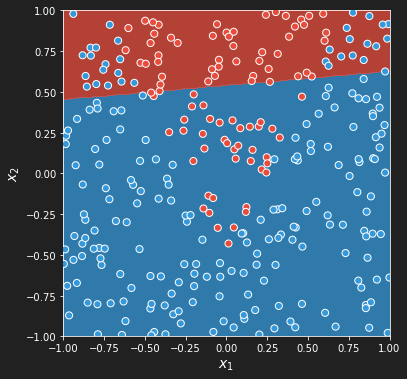

In [50]:
fig = plot_line_and_points(x=x, c=y, clf=clf)
fig.savefig("nl-clf-02.png", dpi=100, facecolor="#212121")

With no activation function (no activation or identity function is exactly the same) the model can only makes a linear separation. There is an equivalent neural network with only a single neuron. And a single neuron can only make linear classification.

We use a ReLU activation function. The lbfgs optimizer algorithm is the best for small datasets like the one we have. max_iter is the maximum number of epochs (knowing that sklearn implements an early-stop feature). It may takes few attemps before having a proper classification with two neurons.

In [51]:
clf = MLPClassifier(hidden_layer_sizes=(2,), activation="relu", solver='lbfgs', max_iter=1000)
clf.fit(x, y)

MLPClassifier(hidden_layer_sizes=(2,), max_iter=1000, solver='lbfgs')

In [52]:
# This is loading from disk a previously trained network
# Comment this block if you want to keep the classifier trained above
if os.path.exists("nl_clf_nn.csv"):
    load_network(clf, "nl_clf_nn.csv")
else:
    save_network(clf, "nl_clf_nn.csv")

And after training we can see that the neural network made a good job:

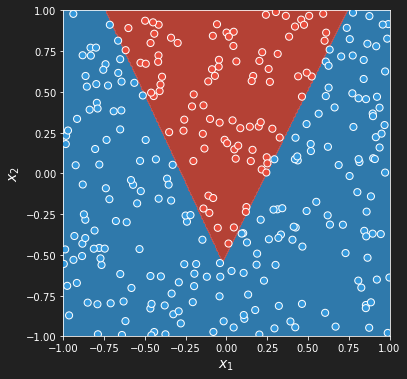

In [53]:
fig = plot_line_and_points(x=x, c=y, clf=clf)
fig.savefig("nl-clf-03.png", dpi=100, facecolor="#212121")

In the cells belows we reconstruct the *intermediate* space in which the last neuron of the network (the one with no activation function) is working:

In [54]:
x1 = np.matmul(x, clf.coefs_[0]) + clf.intercepts_[0]  # weighted sum of the input + bias
x1[x1 < 0] = 0.  # ReLU activation

And here is a visualization of the *intermediate* step along with a visual representation of the output neuron (the white line). We can see that this neuron solves a linear classification problem and that the hidden layer has *just* converted the non-linear problem into a linear one:

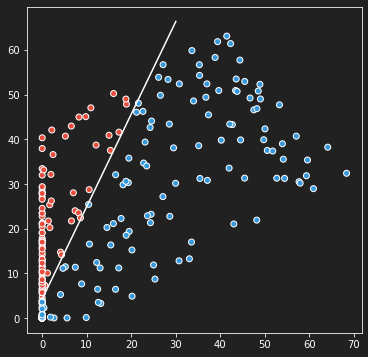

In [55]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111)
ax.scatter(x1[:, 0], x1[:, 1], c=y, cmap=MyColorMap(), edgecolor="w")
_x = np.linspace(0., 30., 11)
_y = - clf.coefs_[1][0] / clf.coefs_[1][1] * _x - clf.intercepts_[1][0] / clf.coefs_[1][1]
ax.plot(_x, _y, c='w');
fig.savefig("nl-clf-04.png", dpi=100, facecolor="#212121")

The following animation shows the transformation from the input space to the intermediate space (the one seen by the last neuron of the network). It shows where points from the dataset get projected to.

In [56]:
# The animation is deactivated to save space in the notebook, turn it one if you want ;)
# anim = make_transform_animation(x, x1, y)
# anim.display()

In [57]:
# anim.save("nl-clf.gif", dpi=200)

### Scikit-Learn: regression

We use the MLPRegressor (Multi-Layer Perceptron) algorithm. We need to build the training sample by separating the inputs from the outputs:

In [58]:
X = np.vstack((df_nl_reg.x, df_nl_reg.y)).T  # used for plotting only
x = X[:, 0].reshape(-1, 1)
y = X[:, 1]

We use a ReLU activation function. The lbfgs optimizer algorithm is the best for small datasets. max_iter is the maximum number of epochs (knowing that sklearn implements an early-stop feature). It may takes few attemps before having a proper regresion with two neurons.

In [59]:
reg = MLPRegressor(hidden_layer_sizes=(2,), activation="relu", solver='lbfgs', max_iter=1000)
reg.fit(x, y)

MLPRegressor(hidden_layer_sizes=(2,), max_iter=1000, solver='lbfgs')

In [60]:
# This is loading from disk a previously trained network
# Comment this block if you want to keep the classifier trained above
if os.path.exists("nl_reg_nn.csv"):
    load_network(reg, "nl_reg_nn.csv")
else:
    save_network(reg, "nl_reg_nn.csv")

And after training we can see that the neural network made a good job:

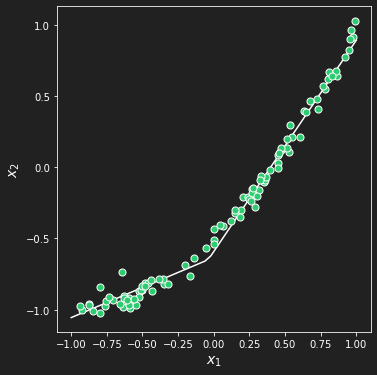

In [61]:
ax = plot_line_and_points(x=X, reg=reg, autofit=True)

In the cell belows, we reconstruct the *intermediate* space in which the last neuron of the network (the one with no activation function) is working:

In [62]:
x1 = np.matmul(x, reg.coefs_[0]) + reg.intercepts_[0]
x1[x1 < 0] = 0.

And here is a visualization of the *intermediate* step. The hidden layer has projected the training datasets onto lines. The output neuron *just* makes a linear combination of these two lines

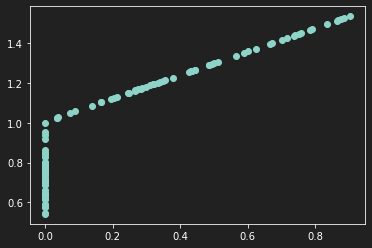

In [63]:
plt.scatter(x1[:, 0], x1[:, 1], cmap=MyColorMap());

## Back propagation

In this section, we will illustrate the back propagation algorithm on two examples:

- linear regression
- non-linear classification

In regression and classification we generally use different loss functions. So we will cover mean-squared error loss for regression and cross-entropy and Hinge loss for classification.

It's out of the scope to discuss the loss functions here, but this is a good reference:

https://rohanvarma.me/Loss-Functions/

In those examples the mini-batch gradient descent optimization is used (without any momentum). Modern neural networks use a loose definition of stochastic gradient descent as most of the time it is an mini-batch gradient descent.

The differences between different gradient descent algorithms. Let's note $S$ the number of samples in the training set and $N$ the number of samples in the training batch ($N < S$):

- **stochastic** gradient descent: a single training sample is used to update the parameters in the model. This implies that there will be as many iterations of the optimizer than there is training sample in a single epoch, so $S$. This is the equivalent of having $N = 1$.
- **mini-batch** gradient descent: a batch of training samples ($N < S$) is used to update the parameters in the model. So there will a number of iterations of the optimizer ($\lfloor\frac{S}{N}\rfloor$) in a single epoch.
- **batch** gradient descent: all training samples ($S$) are used to update the parameters in the model. So there is exactly one optimizer iteration per epoch. This is the **true** gradient algorithm. Both **stochastic** and **mini-batch** gradient descent are providing an approximation. But a conveniant approximation as it speeds the calculation up.

The mini-batch gradient descent updates the parameters according to the formula:

$$
\large w_i^{(k+1)} = w_i^{(k)} - \alpha \sum_{n=1}^{n=N} \frac{\partial\epsilon_n}{\partial w_i^{(k)}}
$$

which can also be written using matrices:

$$
\large w^{(k+1)} = w^{(k)} - \alpha \sum_{n=1}^{n=N} \frac{\partial\epsilon_n}{\partial w^{(k)}}
$$

where:

- $\alpha$ is the learning rate, a strictly positive constant generally lower than 1
- $\epsilon_n$ is the estimated loss for training sample n
- $N$ is the size of the mini-batch
- $(k)$ is the iteration number of the optimizer
- $w_i^{(k)}$ is the i-th parameter of the model at iteration k

The role of the back propagation algorithm is to feed the optimizer algorithm above with gradient of the model parameters. The building idea behind the back propagation algorithm is the application of the chain rules of derivatives.

### Conventions

In the next cells, the following index will be used:

- $_i$: index of the input connected to the weight
- $_j$: index of the neuron for the weights and the biases
- $_n$: sample index in the batch (the mini-batch size being $N$)

The following superscripts will also be used:

- $^{(0)}$: as a superscript this refers to the layer (0) of the neural network
- $^{(1)}$: as a superscript this refers to the layer (1) of the neural network
- $^T$: is the transposed vector or matrix
- $^k$: interation step for the optimizer

### Linear regression

This section illustrates the back propagation algorithm on the linear regression case.

For this example, the network has a single neuron connected to the only input $x$ with weight $w$ and bias $b$:

<img src="./images/neural-network-02.png" width="400">

The loss function is mean squared error that is summed for the mini batch of size $n$:

$$
\large \epsilon = \frac{1}{N} \sum_{n=1}^{N} (y_n - \hat{y}_n)^{2}
$$

or 

$$
\large \epsilon = \sum_{n=1}^{N} \epsilon_n
$$

with:

$$
\large \epsilon_n = \frac{(y_n - \hat{y}_n)^{2}}{N}
$$

where:

- $\epsilon$ is the loss on the mini-batch while $\epsilon_n$ is the loss for the training $n$
- $N$ is the mini-batch size
- $\hat{y}_n$ is the estimate or prediction of the neural network obtained with a forward pass of sample $n$
- $y_n$ is the expected ground truth value for output for sample $n$

The loss function is always positive and a value of 0 means that all samples in the mini-batch match their expected ground truth value $y$

The prediction of the neural network for a given sample $n$ in mini batch is:

$$
\large \hat{y}_n = w x_n + b
$$

Using the chain rule, we can establish that the gradient of the loss with respect to each parameter of the neural network is:

$$
\large \frac{\partial \epsilon_n}{\partial w} = \frac{\partial \epsilon_n}{\partial \hat{y}_n}
                                                \frac{\partial \hat{y}_n}{\partial w} \\
\large \frac{\partial \epsilon_n}{\partial b} = \frac{\partial \epsilon_n}{\partial \hat{y}_n}
                                                \frac{\partial \hat{y}_n}{\partial b} \\
$$

The first step is then to calculate the gradient of the loss with respect to the predicted value by the neural network:

$$
\large \frac{\partial \epsilon_n}{\partial \hat{y}_n} = \frac{2}{N} (\hat{y}_n - y_n)
$$

From now, we will introduce a new parameter $\delta$:

$$
\large \delta_n = \frac{\partial \epsilon_n}{\partial \hat{y}_n} = \frac{2}{N} (\hat{y}_n - y_n)
$$

And then to calculate the derivative of $\hat{y}$ with respect to each parameter of the neural network:

$$
\large \frac{\partial \hat{y}_n}{\partial w} = x_n \\
\large \frac{\partial \hat{y}_n}{\partial b} = 1
$$

The derivative of loss with respect to all parameter of the neural network then becomes:

$$
\large \frac{\partial \epsilon_n}{\partial w} = \delta_n x_n \\
\large \frac{\partial \epsilon_n}{\partial b} = \delta_n \\
$$

We can note that if we have two vectors of the same size $u$ and $v$ then:

$$
\large \sum_i (u_i v_i) = u^T v
$$


The mini batch gradient descent optimization algorithm updates $w$ and $b$ at the $k$th iteration with learning rate $\alpha$ like so:

$$
\large w^{k+1} =  w^{k} - \alpha \sum_{n=1}^N \frac{\partial \epsilon_n}{\partial w^k} \\
\large b^{k+1} =  b^{k} - \alpha \sum_{n=1}^N \frac{\partial \epsilon_n}{\partial b^k} \\
$$

which can be written in a full matrix way:

$$
\large w^{k+1} = w^{k} - \alpha x^{T} \delta \\
\large b^{k+1} = b^{k} - \alpha \mathbb{1}^T \delta \\
$$


where:

- $\mathbb{1}$ is a vector of size N will all its elements equal to 1

In [64]:
# This generic helper class provides all usual functions and their derivatives
# The loss functions are reduced (summed over each sample of the current batch) to display progress
# The derivatives of the loss functions are not reduced. The reduction operation is done in the training step
class NeuralNetwork():
    def predict(self, x):
        # To be implemented
        pass
    def logistic(self, x):
        # logistic activation function
        out = 1. / (1. + np.exp(-x))
        # The next two lines improves stability of the training algorithm, 
        # preventing the loss from being undefined
        out = np.where(out > 1 - 1e-8, 1-1e-8, out)
        out = np.where(out < 0 + 1e-8, 0+1e-8, out)
        return out
    def logistic_prime(self, x):
        # Derivative of the logistic activation function
        return np.exp(-x) / (1. + np.exp(-x))**2
    def tanh(self, x):
        # Tanh activation function which scales output in the [-1., 1.] range (to be used with Hinge loss)
        return np.tanh(x)
    def tanh_prime(self, x):
        # Derivative of the tanh activation function
        return 1. - np.tanh(x)**2
    def relu(self, x):
        # ReLU activation function
        return np.where(x > 0, x, 0.)
    def relu_prime(self, x):
        # Derivative of ReLU activation function
        return np.where(x > 0, 1., 0.)
    def mse(self, y_hat, y):
        # Mean Squared Error loss function
        return ((y_hat - y)**2).sum() / y.shape[0]
    def mse_prime(self, y_hat, y):
        # Derivative of the Mean Squared Error loss function
        # We do not reduce the derivative as we reduce the loss
        # The reduction to a sum will be done when calculationg the gradients for the batch
        return 2 * (y_hat - y) / y.shape[0]
    def cross_entropy(self, y_hat, y):
        # Cross-entropy loss function
        return (- y * np.log(y_hat) - (1 - y) * np.log(1 - y_hat)).sum()
    def cross_entropy_prime(self, y_hat, y):
        # Derivative of the cross-entropy loss function
        return (y_hat - y) / (y_hat * (1 - y_hat))
    def hinge(self, y_hat, y):
        # Hinge loss function
        loss = 1 - y_hat * y
        return np.where(loss > 0, loss, 0.).sum()
    def hinge_prime(self, y_hat, y):
        # Derivative of the Hinge loss function
        return np.where(self.hinge(y_hat, y) > 0, -y, 0.)
    def save(self, filename):
        with open(filename, "wb") as fobj:
            fobj.write(pickle.dumps(self, protocol=2))
    @classmethod
    def load(cls, filename):
        with open(filename, "rb") as fobj:
            return pickle.loads(fobj.read())
#     def save(self, filename):
#         save_network(self, filename)
#     def load(self, filename):
#         return load_network(self, filename)

In [65]:
x = df_lin_reg.x.values.reshape(-1, 1)  # x inputs
y = df_lin_reg.y.values.reshape(-1, 1)  # y targets
X = np.vstack((df_lin_reg.x.values, df_lin_reg.y.values)).T  # xy dataset (only for visualization)

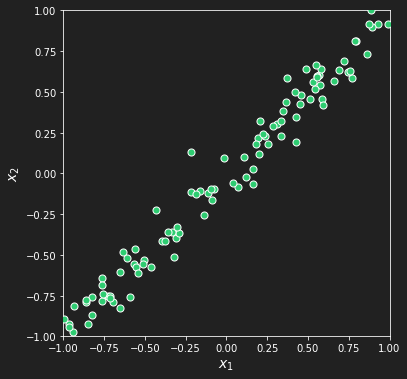

In [66]:
fig = plot_line_and_points(x=X)

In [67]:
# Initialize a neural network with weight and bias. 
class LinearRegression(NeuralNetwork):
    def __init__(self):
        super(LinearRegression, self).__init__()
        # weight and bias initialization with random value from normal distribution
        self.w0 = np.random.normal(0., 1., (1, 1))  # 1 inputs and 1 neuron (in that order)
        self.b0 = np.random.normal(0., 1., (1, 1))  # 1 neurons
    def predict(self, x):
        # Forward pass in the network
        return np.matmul(x, self.w0) + self.b0
model = LinearRegression()

In [68]:
# Set learning rate value for the gradient descent and tolerance on loss for early stop
# Also set the batch_size and the maximal number of epochs
alpha = 0.01  # learning rate
tol = 1.e-5  # tolerance for early stop
max_iter_no_change = 3  # number of iterations required for an early stop
max_epochs = 200  # maximum number of epochs
batch_size = 16  # mini batch size

In [69]:
# Training loop
i_epoch = 0
i_it = 0
previous_loss = 1000.
nb_iter_no_change = 0
while 1:
    # Epochs loop
    running_loss = 0.
    # Shuffle batch at each epoch for a more robust training
    indices = np.arange(0, x.shape[0], 1)
    np.random.shuffle(indices)
    x_shuffled = x[indices]
    y_shuffled = y[indices]
    # Loop on each batch
    i = 0
    while i < x.shape[0]:
        # Get batch
        _x = x_shuffled[i:i + batch_size]
        _y = y_shuffled[i:i + batch_size]
        # Shift index for next batch
        i += batch_size
        # Current batch size
        n = _x.shape[0]
        # Forward pass prediction
        y_hat = model.predict(_x)
        # Calculate the loss with the MSE function
        loss = model.mse(y_hat, _y)
        running_loss += loss * n  # we do not accumulate mean losses
        # Initialize delta parameter for layer (0)
        # delta = d(loss)/d(y_hat) * d(y_hat)/d(z0)
        delta = model.mse_prime(y_hat, _y)
        # Layer (0) gradients
        dw = np.matmul(_x.T, delta)  # this operation calculates sum(xi * deltai)
        db = delta.sum()  # here we need an explicit sum
        # Update layer (1) parameters
        model.w0 -= alpha * dw
        model.b0 -= alpha * db
        # Incremet iteration counter
        i_it += 1
    # Increment epoch and
    i_epoch += 1
    running_loss /= x.shape[0]  # we calculate the mean loss
    # Early stop
    if np.abs(previous_loss - running_loss) < tol:
        nb_iter_no_change += 1
    else:
        nb_iter_no_change = 0
    # Stop iterations ?
    if nb_iter_no_change >= max_iter_no_change:
        print("Epoch: {}, Iterations: {}, Running loss: {:.6f}".format(i_epoch, i_it, running_loss))
        print("Convergence reached.")
        break
    elif i_epoch >= max_epochs:
        print("Epoch: {}, Iterations: {}, Running loss: {:.6f}".format(i_epoch, i_it, running_loss))
        print("Max number of epochs reached.")
        break
    else:
        previous_loss = running_loss

Epoch: 128, Iterations: 896, Running loss: 0.009317
Convergence reached.


In [70]:
# We re-use a previous model that was great for visualization purposes
# You can comment this block if you don't want to re-use a previously trained model
if os.path.exists("lin-reg-backprop.pkl"):
    model = LinearRegression.load("lin-reg-backprop.pkl")
else:
    model.save("lin-reg-backprop.pkl")

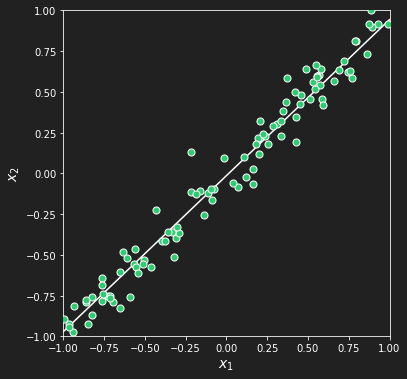

In [71]:
fig = plot_line_and_points(x=X, reg=model)

Here we are, a fitted line through the training samples.

### Non-linear classification

Let's do something a bit more complex now with non-linear classification. There are a few differences with significant impact on the algorithm compared to the linear regression:

- we now have two layers of neurons so the gradient analytical formulation become a bit more complex, so we will introduce a more general version of the back propagation algorithm.
- and because it's a non-linear problem we also have activation functions on the hidden layer.
- we need to use a different loss function (namely the cross entropy loss function).
- the cross entropy function works with probability as input so we need to scale $\hat{y}$ and $y$ in the range [0., 1.]:
    - for $\hat{y}$ we use the logistic function (definition below)
    - for $y$ we simply use a linear scaling

For this example, the network has two neurons in the hidden layer. ReLU activation function is used for the hidden layer. The $\hat{y}$ output is scaled in the range [0., 1.] using a sigmoïd function $\sigma$ that is defined hereafter.

![Non-linear classification](./images/neural-network-01.png)

The $x_{n,i}^{(0)}$ input is a matrix of size (N, 2):

$$
\large x_{n,i}^{(0)} = 
\begin{bmatrix}
x^{(0)}_{1,1} & x^{(0)}_{2,1} \\
x^{(0)}_{1,2} & x^{(0)}_{2,2} \\
... & ... \\
x^{(0)}_{1,N} & x^{(0)}_{2,N} \\
\end{bmatrix}
$$

where $N$ is the mini-batch size.

The $w_{i,j}^{(0)}$ is a (2, 2) matrix containing the weights of the neurons. The first index $i$ relates to the input and the second $j$ to the neuron:

$$
\large w_{i,j}^{(0)} = 
\begin{bmatrix}
w^{(0)}_{1,1} & w^{(0)}_{2,1} \\
w^{(0)}_{1,2} & w^{(0)}_{2,2} \\
\end{bmatrix}
$$

The $b_j^{(0)}$ is a (1, 2) matrix containing the bias of the neurons. The index $j$ relates to the neuron:

$$
\large b_j^{(0)} = 
\begin{bmatrix}
b^{(0)}_{1} & b^{(0)}_{2} \\
\end{bmatrix}
$$

The $w_{i,j}^{(1)}$ is a (2, 1) matrix containing the weights of the neurons. The first index $i$ relates to the input and the second $j$ to the neuron:

$$
\large w_{i,j}^{(1)} = 
\begin{bmatrix}
w^{(1)}_{1,1} \\
w^{(1)}_{2,1} \\
\end{bmatrix}
$$

The $b_j^{(1)}$ is a (1, 1) matrix containing the bias of the neurons. The index $j$ relates to the neuron:

$$
\large b_j^{(1)} = 
\begin{bmatrix}
b^{(1)}_{1} \\
\end{bmatrix}
$$

Having the row index related to input and the column index to be related to the neuron in the weight enables to evaluate the $z^{(0)}$ matrix as:

$$
\large z^{(0)} = x^{(0)} w^{(0)} + b^{(0)}
$$

The $z^{(0)}$ is a (N, 2) matrix where $N$ is the mini-batch size. 
The product between $x^{(0)}$ and $w^{(0)}$ is a (N, 2) matrix while $b^{(0)}$ is a (1, 2) matrix so the operation $+$ is *abusive*. Programming languages provide a way to broadcast the $b^{(0)}$ (1, 2) matrix into a (N, 2) matrix where each row is actually equal to $b^{(0)}$ before doing the $+$ operation.

The $x^{(1)}$ is also a (N, 2) matrix calculated from $z^{(0)}$ thanks to the ReLU function that we will call $r$:

$$
\large x^{(1)} = r(z^{(0)})
$$

The ReLU function is defined as:

$$
\large 
r(x) = x \quad \forall x \in \mathbb{R}^+_* \\
\large
r(x) = 0 \quad \forall x \in \mathbb{R}^- \\
$$

The $z^{(1)}$ matrix of size (N, 1) is then equal to:

$$
\large z^{(1)} = x^{(1)} w^{(1)} + b^{(1)}
$$

$\hat{y}$ is calculated by scaling the $z^{(1)}$ matrix in the [0., 1.] range using the following sigmoïd function (this function is also called the logistic function). This function will be called $\sigma$:

$$
\large 
\sigma(x) = \frac{1}{1 + e^{-x}} \\
$$

The $\hat{y}$ is then:

$$
\large
\hat{y} = \sigma(z^{(1)}) \\
\large
\hat{y} = \sigma(x^{(1)} w^{(1)} + b^{(1)}) \\
\large
\hat{y} = \sigma(r(x^{(0)} w^{(0)} + b^{(0)}) w^{(1)} + b^{(1)}) \\
$$

In terms of loss function, the cross-entropy function is used and has the following expression:

$$
\large \epsilon = - \sum_{n=1}^N y_n log(\hat{y}_n) + (1 - y_n) log(1 - \hat{y}_n)
$$

or

$$
\large \epsilon = \sum_{n=1}^N \epsilon_n
$$

with:

$$
\large \epsilon_n = - y_n log(\hat{y}_n) - (1 - y_n) log(1 - \hat{y}_n)
$$

For clarity, $log$ denotes the base $e$ logarithm.

We will introduce a more general method to apply the back propagation algorithm. This more general method consists in calculatiing a $\delta$ matrix that will be updated as we move backwards in the neural network. The 
back propagation is based on the chain rule of the derivatives so we can write the following equations.

First the derivative of the cost function:

$$
\large \frac{\partial \epsilon_n}{\partial \hat{y}_n} 
    = - \frac{\partial \big( y_n log(\hat{y}_n) + (1 - y_n) log(1 - \hat{y}_n) \big) }{\partial \hat{y}_n}
    = \frac{\hat{y}_n - {y}_n}{\hat{y}_n (1 - \hat{y}_n)}
$$

Then, the derivative of the sigmoïd function:

$$
\large \frac{\partial \sigma(z_n^{(1)})}{\partial z^{(1)}}
    =  \frac{e^{-z_n^{(1)}}}{(1. + e^{-z_n^{(1)}})^2}
    = \sigma(z_n^{(1)}) (1 - \sigma(z_n^{(1)}))
    = \hat{y}_n (1 - \hat{y}_n)
$$

So the derivative:

$$
\large \frac{\partial \epsilon_n}{\partial z_n^{(1)}} 
= \frac{\partial \epsilon_n}{\hat{y}_n} \frac{\partial \hat{y}_n}{\partial z_n^{(1)}}
= \frac{\partial \epsilon_n}{\hat{y}_n} \frac{\partial \sigma(z_n^{(1)})}{\partial z_n^{(1)}}
$$

can be simplified into:

$$
\large \frac{\partial \epsilon_i}{\partial z_n^{(1)}} 
= \frac{\hat{y}_n - {y}_n}{\hat{y}_n (1 - \hat{y}_n)} \hat{y}_n (1 - \hat{y}_n)
= \hat{y}_n - y_n
$$

We now introduce the $\delta$ term as:

$$
\large \delta_n^{(1)} = \large \frac{\partial \epsilon_n}{\partial z_n^{(1)}} = \hat{y}_n - y_n
$$

At layer (1), the gradients of the neural network parameter can be written as follow:

$$
\large \frac{\partial \epsilon_n}{\partial w_i^{(1)}} 
= \frac{\partial \epsilon_n}{\partial z_n^{(1)}}\frac{\partial z_n^{(1)}}{\partial w_i^{(1)}}
= \delta_n^{(1)} \frac{\partial z_n^{(1)}}{\partial w_i^{(1)}}
= \delta_n^{(1)} x_{n,i}^{(1)}
$$

where:

- $w_i = w_{i,j=1}$ because there is a single neuron at layer (1)

$$
\large \frac{\partial \epsilon_n}{\partial b^{(1)}}
= \frac{\partial \epsilon_n}{\partial z_n^{(1)}}\frac{\partial z_n^{(1)}}{\partial b^{(1)}}
= \delta_n^{(1)} \frac{\partial z_n^{(1)}}{\partial b^{(1)}}
= \delta_n^{(1)}
$$

We have introduced $i$ index which is the index of the neuron input (this neuron has 2 inputs so $i$ is in the range [1, 2]). Because we have a single neuron $j=1$, we have dropped the $j$ index. Note that $x$ is a $x_{n,i}$ matrix where N is the size of the mini batch.

Now we can update the parameters of the layer (1) with gradient descent:

$$
\large w_i^{(1), k+1} =  w_i^{(1), k} - \alpha \sum_{n=1}^N \frac{\partial \epsilon_n}{\partial w_i^{(1)}}
               =  w_i^{(1), k} - \alpha \sum_{n=1}^N \delta_n^{(1)} x_{n,i}^{(1)}\\
\large b^{(1), k+1} =  b^{(1),k} - \alpha \sum_{n=1}^N \frac{\partial \epsilon_n}{\partial b^{(1)}} 
               =  b^{(1),k} - \alpha \sum_{n=1}^N \delta_n^{(1)} \\
$$

which can be written in a full matrix way:

$$
\large w^{(1),k+1} = w^{(1),k} - \alpha x^{(1)T} \delta^{(1)} \\
\large b^{(1),k+1} = b^{(1),k} - \alpha \mathbb{1}^T \delta^{(1)} \\
$$

Now we need to make a step in the back propagation before we can update the parameters of the layer (0).

To progress in the back propagation, we need to once again apply the chain rule so that we can update the $\delta$ parameter.

One important notice, the $i$ and $j$ indices shall be interpreted regarding layer (0), so $i$ is index of the input $x^{(0)}$ and $j$ is the index of the neuron, which is also the index of the output of the layer (0).

$$
\large \frac{\partial \epsilon_n}{\partial z_{n,j}^{(0)}}
= \frac{\partial \epsilon_n}{\partial z_n^{(1)}} \frac{\partial z_n^{(1)}}{\partial x_{n,j}^{(1)}}
  \frac{\partial x_{n,j}^{(1)}}{\partial z_{n,j}^{(0)}}
= \delta_n^{(1)} w_{j}^{(1)} r'(z_{n,j}^{(0)})
$$

where:

- $r'$ is the derivative of the ReLU function with respect to its input
- at layer (0), the number of inputs for neuron at layer (1) is $j$ because $j$ is the number of outputs of layer (0), that's the reason we are writting $w_j^{(1)}$ in this equation.

We will then introduce a new $\delta$ parameter:

$$
\large \delta_{n,j}^{(0)}
= \delta_{n}^{(1)} w_{j}^{(1)} r'(z_{n,j}^{(0)})
$$

which can be written with matrices:

$$
\large \delta^{(0)}
= \delta^{(1)} w^{(1)T} \odot r'(z^{(0)})
$$

where $\odot$ is the Hadamard product (element-wise product) which will be used for two matrices of size (n, j).

Once this new $\delta^{(0)}$ is calculated, like for the layer (1), the derivatives of the loss with respect to weights and biases can be written follow:

$$
\large \frac{\partial \epsilon_n}{\partial w_{i,j}^{(0)}} 
= \frac{\partial \epsilon_n}{\partial z_{n,j}^{(0)}}\frac{\partial z_{n,j}^{(0)}}{\partial w_{i,j}^{(0)}}
= \delta_{n,j}^{(0)} \frac{\partial z_{n,j}^{(0)}}{\partial w_{i,j}^{(0)}}
= \delta_{n,j}^{(0)} x_{n,i}^{(0)}
$$

$$
\large \frac{\partial \epsilon_n}{\partial b_j^{(0)}}
= \frac{\partial \epsilon_n}{\partial z_{n,j}^{(0)}}\frac{\partial z_{n,j}^{(0)}}{\partial b_j^{(0)}}
= \delta_{n,j}^{(0)} \frac{\partial z_{n,j}^{(0)}}{\partial b_j^{(0)}}
= \delta_{n,j}^{(0)}
$$

Now we can update the parameters of the layer (1) with gradient descent:

$$
\large w_{i,j}^{(0), k+1} =  w_{i,j}^{(0), k} - \alpha \sum_{n=1}^N \frac{\partial \epsilon_n}{\partial w_{i,j}^{(0)}}
               =  w_{i,j}^{(0), k} - \alpha \sum_{n=1}^N \delta_{n,j}^{(0)} x_{n,i}^{(0)} \\
\large b_j^{(0), k+1} =  b_j^{(0),k} - \alpha \sum_{n=1}^N \frac{\partial \epsilon_n}{\partial b_j^{(0)}} 
               =  b_j^{(0),k} - \alpha \sum_{n=1}^N \delta_{n,j}^{(0)}\\
$$

which can be written in a full matrix way:

$$
\large w^{(0), k+1} = w^{(0),k} - \alpha x^{(0)T} \delta^{(0)} \\
\large b^{(0), k+1} = b^{(0),k} - \alpha \mathbb{1}^T \delta^{(0)} \\
$$

In [72]:
x = np.vstack((df_nl_clf.x.values, df_nl_clf.y.values)).T  # x inputs
y = df_nl_clf.c.values  # target values

In [73]:
# Set learning rate value for the gradient descent and tolerance on loss for early stop
# Also set the batch_size and the maximal number of epochs
alpha = 0.01  # learning rate
tol = 1.e-5  # tolerance for early stop
max_iter_no_change = 3  # number of iterations required for an early stop
max_epochs = 300  # maximum number of epochs
batch_size = 16  # mini batch size
loss_function = 'cross-entropy'  # this can be either 'cross-entropy' or 'hinge'

In [74]:
# We monitor the change of each parameter in the network
# The recording is made at each epoch
loss_records = []
param_records = {
    "w0[0, 0]": [], 
    "w0[0, 1]": [],
    "w0[1, 0]": [], 
    "w0[1, 1]": [],    
    "b0[0, 0]": [],
    "b0[0, 1]": [],
    "w1[0, 0]": [], 
    "w1[1, 0]": [],    
    "b1[0, 0]": [],
}
backpropagation_history = {
    "loss_records": loss_records,
    "param_records": param_records,
}

In [75]:
# Initialize a neural network with weight and bias. 
# It has a predict method so it can be used in the plotting function
class NonLinearClassification(NeuralNetwork):
    def __init__(self, loss_function):
        super(NonLinearClassification, self).__init__()
        self.loss_function = loss_function
        # weight and bias initialization with random value from normal distribution
        self.w0 = np.random.normal(0., 1., (2, 2))  # 2 inputs and 2 neurons (in that order)
        self.b0 = np.random.normal(0., 1., (1, 2))  # 2 neurons
        self.w1 = np.random.normal(0., 1., (2, 1))  # 2 inputs and 1 neuron (in that order)
        self.b1 = np.random.normal(0., 1., (1, 1))  # 1 neuron
        self.z0 = None  # intermediate value used for back propagation
        self.x1 = None  # intermediate value used for back propagation
        self.z1 = None  # intermediate value used for back propagation
    def predict(self, x):
        self.z0 = np.matmul(x, self.w0) + self.b0
        self.x1 = self.relu(self.z0)
        self.z1 = np.matmul(self.x1, self.w1) + self.b1
        if self.loss_function == "hinge":
            return self.tanh(self.z1)
        elif self.loss_function == "cross-entropy":
            return self.logistic(self.z1)
    def record(self, history):
        history["w0[0, 0]"].append(self.w0[0, 0])
        history["w0[0, 1]"].append(self.w0[0, 1])
        history["w0[1, 0]"].append(self.w0[1, 0])
        history["w0[1, 1]"].append(self.w0[1, 1])
        history["b0[0, 0]"].append(self.b0[0, 0])
        history["b0[0, 1]"].append(self.b0[0, 1])
        history["w1[0, 0]"].append(self.w1[0, 0])
        history["w1[1, 0]"].append(self.w1[1, 0])
        history["b1[0, 0]"].append(self.w1[0, 0])
    def copy(self):
        other = NonLinearClassification(self.loss_function)
        other.w0 = self.w0[:]
        other.b0 = self.b0[:]
        other.w1 = self.w1[:]
        other.b1 = self.b1[:]
        return other
model = NonLinearClassification(loss_function)

In [76]:
# Training loop
i_epoch = 0
i_it = 0
nb_iter_no_change = 0
# We make a first estimation of the loss before any optimization is made
# That will be the starting point of our recordings
y_hat = model.predict(x)
if loss_function == "hinge":
    _y = y.reshape(-1, 1)
    loss = model.hinge(y_hat, _y)
elif loss_function == "cross-entropy":
    _y = y.reshape(-1, 1) * 0.5 + 0.5
    loss = model.cross_entropy(y_hat, _y)
previous_loss = loss / x.shape[0]
backpropagation_history["loss_records"].append(previous_loss)
model.record(backpropagation_history["param_records"])
# We can now start the training
while i_epoch < max_epochs:
    running_loss = 0.
    # Shuffle batch at each epoch for a more robust training
    indices = np.arange(0, x.shape[0], 1)
    np.random.shuffle(indices)
    x_shuffled = x[indices]
    y_shuffled = y[indices]
    # Loop on each batch
    i = 0
    while i < x.shape[0]:
        # Get batch
        _x = x_shuffled[i:i + batch_size]
        if loss_function == "hinge":
            # we already have the targets in the range [-1., 1.]
            _y = y_shuffled[i:i + batch_size].reshape(-1, 1)
        elif loss_function == "cross-entropy":
            # we have the targets in the range [-1., 1.], we scale them to be in [0., 1.]
            _y = y_shuffled[i:i + batch_size].reshape(-1, 1) * 0.5 + 0.5
        # Shift index for next batch
        i += batch_size
        # Current batch size
        n = _x.shape[0]
        # Forward pass prediction
        y_hat = model.predict(_x)
        # Calculate the loss with the Hinge function or the cross entropy loss
        if loss_function == "hinge":
            loss = model.hinge(y_hat, _y)
        elif loss_function == "cross-entropy":
            loss = model.cross_entropy(y_hat, _y)
        running_loss += loss
        # Initialize delta parameter for layer (1)
        # delta = d(loss)/d(y_hat) * d(y_hat)/d(z1)
        if loss_function == "hinge":
            delta = model.hinge_prime(y_hat, _y) * model.tanh_prime(model.z1)
        elif loss_function == "cross-entropy":
            delta = y_hat - _y
        # Layer (1) gradients
        dw = np.matmul(model.x1.T, delta)
        db = delta.sum()
        # Update layer (1) parameters
        model.w1 -= alpha * dw
        model.b1 -= alpha * db
        # Update delta parameter for layer (0)
        # delta = d(loss)/d(y_hat) * d(y_hat)/d(z1) * d(z1)/d(x1) * d(x1)/d(z0)
        # this step involves a Hadamard product (element-wise) for the derivative of ReLU function
        delta = np.matmul(delta, model.w1.T) * model.relu_prime(model.z0)
        # Layer (0) gradients
        dw = np.matmul(_x.T, delta)
        db = delta.sum()
        # Update layer (0) parameters
        model.w0 -= alpha * dw
        model.b0 -= alpha * db
        # Increment iteration counter
        i_it += 1     
    # Increment epoch and
    i_epoch += 1
    running_loss /= x.shape[0]  # we calculate the mean loss
    # We make a recording
    backpropagation_history["loss_records"].append(running_loss)
    model.record(backpropagation_history["param_records"])
    # Early stop
    if np.abs(previous_loss - running_loss) < tol:
        nb_iter_no_change += 1
    else:
        nb_iter_no_change = 0
    # Stop iterations ?
    if nb_iter_no_change >= max_iter_no_change:
        print("Epoch: {}, Iterations: {}, Running loss: {:.6f}".format(i_epoch, i_it, running_loss))
        print("Convergence reached.")
        break
    elif i_epoch >= max_epochs:
        print("Epoch: {}, Iterations: {}, Running loss: {:.6f}".format(i_epoch, i_it, running_loss))
        print("Max number of epochs reached.")
        break
    else:
        previous_loss = running_loss

Epoch: 300, Iterations: 5700, Running loss: 0.478542
Max number of epochs reached.


Note that it can take a few tries before you get a decent loss. The problem is still highly dependent on the parameter initialisation.

In [77]:
# We re-use a previous model that was great for visualization purposes
# You can comment this block if you don't want to re-use a previously trained model
if os.path.exists("nl-clf-backprop.pkl") and os.path.exists("backprop-hist.pkl"):
    model = NonLinearClassification.load("nl-clf-backprop.pkl")
    with open("backprop-hist.pkl", "rb") as fobj:
        backpropagation_history = pickle.loads(fobj.read())    
else:
    model.save("nl-clf-backprop.pkl")
    with open("backprop-hist.pkl", "wb") as fobj:
        fobj.write(pickle.dumps(backpropagation_history, protocol=2))    

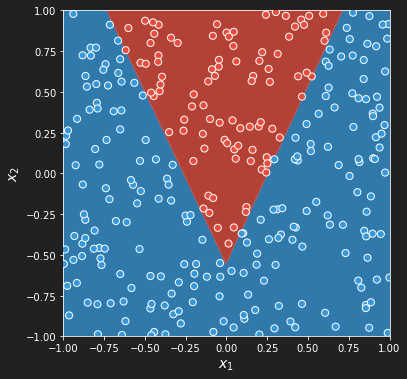

In [78]:
fig = plot_line_and_points(x=x, c=y, clf=model)

The neural network makes a decent job at classifying the red and the blue points

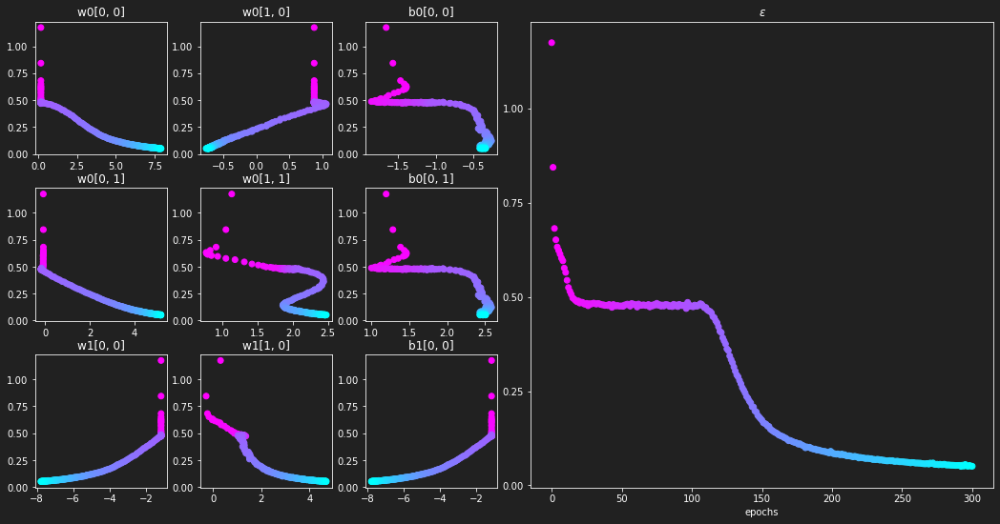

In [79]:
fig = plt.figure(figsize=(18, 9))
c = range(len(backpropagation_history["loss_records"]))
gs = fig.add_gridspec(3, 6)
ax1 = fig.add_subplot(gs[0, 0])
ax1.scatter(backpropagation_history["param_records"]["w0[0, 0]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax1.set_title("w0[0, 0]")
ax2 = fig.add_subplot(gs[0, 1], sharey=ax1)
ax2.scatter(backpropagation_history["param_records"]["w0[1, 0]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax2.set_title("w0[1, 0]")

ax3 = fig.add_subplot(gs[0, 2], sharey=ax1)
ax3.scatter(backpropagation_history["param_records"]["b0[0, 0]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax3.set_title("b0[0, 0]")

ax4 = fig.add_subplot(gs[1, 0], sharey=ax1)
ax4.scatter(backpropagation_history["param_records"]["w0[0, 1]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax4.set_title("w0[0, 1]")

ax5 = fig.add_subplot(gs[1, 1], sharey=ax1)
ax5.scatter(backpropagation_history["param_records"]["w0[1, 1]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax5.set_title("w0[1, 1]")

ax6 = fig.add_subplot(gs[1, 2], sharey=ax1)
ax6.scatter(backpropagation_history["param_records"]["b0[0, 1]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax6.set_title("b0[0, 1]")

ax7 = fig.add_subplot(gs[2, 0], sharey=ax1)
ax7.scatter(backpropagation_history["param_records"]["w1[0, 0]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax7.set_title("w1[0, 0]")

ax8 = fig.add_subplot(gs[2, 1], sharey=ax1)
ax8.scatter(backpropagation_history["param_records"]["w1[1, 0]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax8.set_title("w1[1, 0]")

ax9 = fig.add_subplot(gs[2, 2], sharey=ax1)
ax9.scatter(backpropagation_history["param_records"]["b1[0, 0]"], 
            backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax9.set_title("b1[0, 0]");

ax10 = fig.add_subplot(gs[0:, 3:], sharey=ax1)
ax10.scatter(c, 
             backpropagation_history["loss_records"], c=c, cmap="cool_r")
ax10.set_title("$\epsilon$")
ax10.set_xlabel("epochs");
fig.subplots_adjust(hspace=0.25, wspace=0.25)

The picture above illustrates how neural network parameters have been updated at each epoch in order to minimize the loss of the neural network. Pink color represents the early stages of the back propagation algorithm while the cyan points represent the end of the training. It seems that we could have done additional epochs to train the neural network even further.

We see a plateau in the loss function around 50 epochs before the neural network significantly improves its accuracy between 100 and 150 epochs.

In [80]:
# The animation is deactivated to save space in the notebook, turn it one if you want ;)
# anim = make_loss_animation(backpropagation_history, group_size=30, interval=50)
# anim.display()

In [81]:
# anim.save("nl-clf-loss.gif")

In [82]:
anim = make_parameter_animation(model, "w0", (1, 1), np.linspace(-10., 10., 100), 
                                x, y.reshape(-1, 1) * 0.5 + 0.5)
anim.display()

In [1166]:
# anim.save("nl-clf-loss-02.gif", dpi=200)

## Gradient descent

This section illustrates the gradient descent algorithm and the impact of momentum. Momentum makes more likely to get a global optimum while it slows the convergence down.

In [254]:
def f(x):
    return x**4 - 5.* x**2 - 3 * x
def f_prime(x):
    return 4 * x**3 - 10. * x - 3.

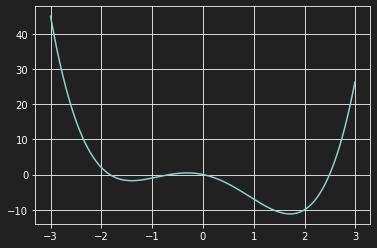

In [255]:
x = np.arange(-3., 3., 0.01)
y = f(x)
y_prime = f_prime(x)
plt.plot(x, y)
plt.grid()

In [256]:
def gd(f_prime, x0, alpha=0.01, tol=1e-8, max_iter=1000, beta=0.9):
    history = [x0]
    i = 0
    previous_delta = 0.
    while 1:
        i += 1
        gradient = f_prime(x0)
        delta = - alpha * gradient
        delta = previous_delta * beta + delta        
        x0 += delta
        previous_delta = delta
        history.append(x0)
        if np.abs(delta) < tol:
            break
        if i >= max_iter:
            break
    return x0, np.array(history), i, np.abs(delta)

In [257]:
x0, x0_hist, nb_iter, tol = gd(f_prime, x0=-2., alpha=0.01, beta=0.99, max_iter=10000)
print(nb_iter, tol)

2236 2.916126284978999e-11


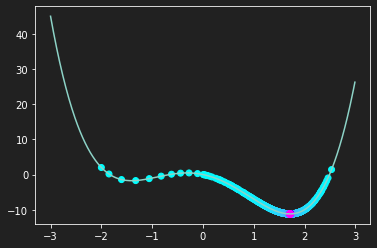

In [258]:
c = np.linspace(0., 1., len(x0_hist))
plt.plot(x, f(x))
plt.scatter(x0_hist, f(x0_hist), c=c, cmap="cool");